## Attempting to quantify Gender differences using the Kaggle Developer Survey

One of the questions I try to answer in this notebook is whether there is gender inequality in the Tech space. Assuming there is some, which there probably is seeing as a good percentage of survey respondents are males, how does this impact earning potential.

In this notebook I:

* First visualize and normalize gender differences in the sample.
* Run a multiple linear regression to understand which factors contribute most to earning potential.
* Run a lasso regression to narrow variable set and try to quantify the extent gender impacts earning potential.
* Run a random forest on same data to evaluate feature importance (A nonlinear model like this is a good check).
* Compare models for just subsets of women and men to hopefully normalize for more variables.

In [1]:
# Import libraries

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px 

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [2]:
# load data 
df = pd.read_csv('kaggle_survey_2020_responses.csv')
display(df.shape)

# remove the top row
df_fin = df.iloc[1:,:]

C:\Users\ugonn\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


(20037, 355)

In [3]:
# inspect the data and questions 

df.head()

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7_Part_1,Q7_Part_2,Q7_Part_3,Q7_Part_4,Q7_Part_5,Q7_Part_6,Q7_Part_7,Q7_Part_8,Q7_Part_9,Q7_Part_10,Q7_Part_11,Q7_Part_12,Q7_OTHER,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_Part_9,Q9_Part_10,Q9_Part_11,Q9_OTHER,Q10_Part_1,Q10_Part_2,Q10_Part_3,Q10_Part_4,Q10_Part_5,Q10_Part_6,Q10_Part_7,Q10_Part_8,Q10_Part_9,Q10_Part_10,Q10_Part_11,Q10_Part_12,Q10_Part_13,Q10_OTHER,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_OTHER,Q13,Q14_Part_1,Q14_Part_2,Q14_Part_3,Q14_Part_4,Q14_Part_5,Q14_Part_6,Q14_Part_7,Q14_Part_8,Q14_Part_9,Q14_Part_10,Q14_Part_11,Q14_OTHER,Q15,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_Part_13,Q16_Part_14,Q16_Part_15,Q16_OTHER,Q17_Part_1,Q17_Part_2,Q17_Part_3,Q17_Part_4,Q17_Part_5,Q17_Part_6,Q17_Part_7,Q17_Part_8,Q17_Part_9,Q17_Part_10,Q17_Part_11,Q17_OTHER,Q18_Part_1,Q18_Part_2,Q18_Part_3,Q18_Part_4,Q18_Part_5,Q18_Part_6,Q18_OTHER,Q19_Part_1,Q19_Part_2,Q19_Part_3,Q19_Part_4,Q19_Part_5,Q19_OTHER,Q20,Q21,Q22,Q23_Part_1,Q23_Part_2,Q23_Part_3,Q23_Part_4,Q23_Part_5,Q23_Part_6,Q23_Part_7,Q23_OTHER,Q24,Q25,Q26_A_Part_1,Q26_A_Part_2,Q26_A_Part_3,Q26_A_Part_4,Q26_A_Part_5,Q26_A_Part_6,Q26_A_Part_7,Q26_A_Part_8,Q26_A_Part_9,Q26_A_Part_10,Q26_A_Part_11,Q26_A_OTHER,Q27_A_Part_1,Q27_A_Part_2,Q27_A_Part_3,Q27_A_Part_4,Q27_A_Part_5,Q27_A_Part_6,Q27_A_Part_7,Q27_A_Part_8,Q27_A_Part_9,Q27_A_Part_10,Q27_A_Part_11,Q27_A_OTHER,Q28_A_Part_1,Q28_A_Part_2,Q28_A_Part_3,Q28_A_Part_4,Q28_A_Part_5,Q28_A_Part_6,Q28_A_Part_7,Q28_A_Part_8,Q28_A_Part_9,Q28_A_Part_10,Q28_A_OTHER,Q29_A_Part_1,Q29_A_Part_2,Q29_A_Part_3,Q29_A_Part_4,Q29_A_Part_5,Q29_A_Part_6,Q29_A_Part_7,Q29_A_Part_8,Q29_A_Part_9,Q29_A_Part_10,Q29_A_Part_11,Q29_A_Part_12,Q29_A_Part_13,Q29_A_Part_14,Q29_A_Part_15,Q29_A_Part_16,Q29_A_Part_17,Q29_A_OTHER,Q30,Q31_A_Part_1,Q31_A_Part_2,Q31_A_Part_3,Q31_A_Part_4,Q31_A_Part_5,Q31_A_Part_6,Q31_A_Part_7,Q31_A_Part_8,Q31_A_Part_9,Q31_A_Part_10,Q31_A_Part_11,Q31_A_Part_12,Q31_A_Part_13,Q31_A_Part_14,Q31_A_OTHER,Q32,Q33_A_Part_1,Q33_A_Part_2,Q33_A_Part_3,Q33_A_Part_4,Q33_A_Part_5,Q33_A_Part_6,Q33_A_Part_7,Q33_A_OTHER,Q34_A_Part_1,Q34_A_Part_2,Q34_A_Part_3,Q34_A_Part_4,Q34_A_Part_5,Q34_A_Part_6,Q34_A_Part_7,Q34_A_Part_8,Q34_A_Part_9,Q34_A_Part_10,Q34_A_Part_11,Q34_A_OTHER,Q35_A_Part_1,Q35_A_Part_2,Q35_A_Part_3,Q35_A_Part_4,Q35_A_Part_5,Q35_A_Part_6,Q35_A_Part_7,Q35_A_Part_8,Q35_A_Part_9,Q35_A_Part_10,Q35_A_OTHER,Q36_Part_1,Q36_Part_2,Q36_Part_3,Q36_Part_4,Q36_Part_5,Q36_Part_6,Q36_Part_7,Q36_Part_8,Q36_Part_9,Q36_OTHER,Q37_Part_1,Q37_Part_2,Q37_Part_3,Q37_Part_4,Q37_Part_5,Q37_Part_6,Q37_Part_7,Q37_Part_8,Q37_Part_9,Q37_Part_10,Q37_Part_11,Q37_OTHER,Q38,Q39_Part_1,Q39_Part_2,Q39_Part_3,Q39_Part_4,Q39_Part_5,Q39_Part_6,Q39_Part_7,Q39_Part_8,Q39_Part_9,Q39_Part_10,Q39_Part_11,Q39_OTHER,Q26_B_Part_1,Q26_B_Part_2,Q26_B_Part_3,Q26_B_Part_4,Q26_B_Part_5,Q26_B_Part_6,Q26_B_Part_7,Q26_B_Part_8,Q26_B_Part_9,Q26_B_Part_10,Q26_B_Part_11,Q26_B_OTHER,Q27_B_Part_1,Q27_B_Part_2,Q27_B_Part_3,Q27_B_Part_4,Q27_B_Part_5,Q27_B_Part_6,Q27_B_Part_7,Q27_B_Part_8,Q27_B_Part_9,Q27_B_Part_10,Q27_B_Part_11,Q27_B_OTHER,Q28_B_Part_1,Q28_B_Part_2,Q28_B_Part_3,Q28_B_Part_4,Q28_B_Part_5,Q28_B_Part_6,Q28_B_Part_7,Q28_B_Part_8,Q28_B_Part_9,Q28_B_Part_10,Q28_B_OTHER,Q29_B_Part_1,Q29_B_Part_2,Q29_B_Part_3,Q29_B_Part_4,Q29_B_Part_5,Q29_B_Part_6,Q29_B_Part_7,Q29_B_Part_8,Q29_B_Part_9,Q29_B_Part_10,Q29_B_Part_11,Q29_B_Part_12,Q29_B_Part_13,Q29_B_Part_14,Q29_B_Part_15,Q29_B_Part_16,Q29_B_Part_17,Q29_B_OTHER,Q31_B_Part_1,Q31_B_Part_2,Q31_B_Part_3,Q31_B_Part_4,Q31_B_Part_5,Q31_B_Part_6,Q31_B_Part_7,Q31_B_Part_8,Q31_B_Part_9,Q31_B_Part_10,Q31_B_Part_11,Q31_B_Part_12,Q31_B_Part_13,Q31_B_Part_14,Q31_B_OTHER,Q33_B_Part_1,Q33_B_Part_2,Q33_B_Part_3,Q33_B_Part_4,Q33_B_Part_5,Q33_B_Part_6,Q33_B_Part_7,Q33_B_OTHER,Q34_B_Part_1,Q34_B_Part_2,Q34_B_Part_3,Q34_B_Part_4,Q34_B_Part_5,Q34_B_Part_6,Q34_B_Part_7,Q34_

In [4]:
# create a dictionary for questions 
Questions = {}

# create list of questions 
# not very efficient, but keeps things ordered
qnums = list(dict.fromkeys([i.split('_')[0] for i in df_fin.columns])) # returns a list of column names

# add data for each question to key value pairs in dictionary
for i in qnums:
    if i in ['Q1','Q2','Q3']: # since we are using .startswith() below this prevents all questions that start with 
        Questions[i] = df_fin[i] # [1,2,3] from going in the key value pair
    else:
        Questions[i] = df_fin[[q for q in df_fin.columns if q.startswith(i)]]

In [5]:
# create dictionary for different gender selections 
Genders = {}
for i in df_fin.Q2.unique():
    Genders[i] = df_fin[df_fin.Q2 == i]

In [6]:
# look at gender distribution
df_fin.Q2.value_counts() / df_fin.Q2.value_counts().sum()

Man                        0.788032
Woman                      0.193552
Prefer not to say          0.013126
Prefer to self-describe    0.002695
Nonbinary                  0.002595
Name: Q2, dtype: float64

In [7]:
# filter dataframe for male & female for simplicity (not that prefer not & nonbinary aren't important!)
df_mf = df_fin[df_fin.Q2.isin(['Man','Woman'])] 

In [8]:
# DS is clearly already a male dominated field (or at least this sample of kaggle users is)
df_mf.Q2.value_counts() / df_mf.Q2.value_counts().sum() 

Man      0.802817
Woman    0.197183
Name: Q2, dtype: float64

In [9]:
# Female Distribution by Role 
fig = px.histogram(df_mf, x='Q4', color='Q2')
fig.show()

This plot shows the number of men and women in each category(degree). It does not really tell us anything since we already know that this dataset is male dominated.

In [10]:
# Female Distribution by Role Normalized by sample of respective population 
fig= px.histogram(df_mf, x='Q4',color='Q2', histnorm='probability density')
fig.show()

This plot shows the percentage of women that are in each category. Right off the bat we see that a lot of women have Master's degrees (42.7%) and this is closely followed by 34% in the Bachelor's degree category. Men have 39.7% and 36.2% in Master's and Bachelor's degree categories respectively.

In [11]:
# Do more women have a particular Level of Education than men
male_degrees = df_mf[df_mf.Q2 == 'Man'].Q4.value_counts(normalize=True)
female_degrees = df_mf[df_mf.Q2 == 'Woman'].Q4.value_counts(normalize=True)
# total_degrees = df_mf.Q4.value_counts()
more_women = female_degrees - male_degrees # greater proportion of women than men
color = np.where(more_women.values < 0, 'red', 'blue')
fig = go.Figure(go.Bar(x=more_women.index, y=more_women.values, marker_color=color))
fig.update_layout(title= "How much more/less women are there in proportion to men for each Level of Education")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

In this plot, we see that a higher percentage of women have Masters and Doctoral degrees when compared to men. Seeing that the percentage of women is less in Bachelor's degree, we can assume that women prefer to further their education after getting a Bachelor's degree.

Also, a lower percentage of women have no formal education past high school and also, a lower percentage had some level of college education but they did not finish.

In [12]:
# Percent more or less than distribution of the proportion of women
female_degrees = df_mf[df_mf.Q2 == 'Woman'].Q4.value_counts()
total_degrees = df_mf.Q4.value_counts()
more_women = (female_degrees / total_degrees) - .197 # greater proportion of women than sample proportion
color = np.where(more_women.values < 0, 'red', 'blue')
fig = go.Figure(go.Bar(x=more_women.index, y=more_women.values, marker_color=color))
fig.update_layout(title= "Level of Female Education Relative to Percentage of Sample women (19.7%)")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()


This plot shows how much the proportion of women in each level of education is better/worse than the proportion of women in the sample. In an ideal scenario, the proportion of women for each level of education would be the same as the proportion of women in the sample but that is not the case. 

The most obvious is the _No formal education past high school_ category. Here, the proportion of women in this category is very small (about 13.6% less than the percentage of women in the sample, 19.7%). This is a good thing since it means that a higher percentage of women has some college education at least.

In [13]:
# Gender Distribution by Country
fig = px.histogram(df_mf, x='Q3', color ='Q2')
fig.update_xaxes(categoryorder= "total descending")
fig.show()


In [14]:
# Percent more or less than distribution of the proportion of women 
female_country = df_mf[df_mf.Q2 == 'Woman'].Q3.value_counts()
total_country = df_mf.Q3.value_counts()
more_women = (female_country / total_country) - .197 # greater proportion of women than sample
color = np.where(more_women.values < 0, 'red', 'blue')
fig = go.Figure(go.Bar(x=more_women.index, y=more_women.values, marker_color=color))
fig.update_layout(title= "Amount of Women By Country Relative to Percentage of Sample women (19.7%)")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

Malaysia has the highest proportion of women and is 19.5% more than the proportion of women in the sample. Japan is the country has the lowest proportion of women in this sample.

In [15]:
# function for creating new plots without having to repeat all that code 
def create_norm_graph(qnum, data, title, baseline):
    '''
    This function creates interactive plots using plotly graph objects.
    The function makes a bar plot that shows how much a category performed relative to a baseline provided.
    
    Args:
        qnum: column from the dataframe
        data: the dataframe
        title: title for the plot
        baseline: baseline to compare values of the column with
        
    Returns:
        The bar plot showing proportions relative to a baseline
    '''
    
    male = data[data.Q2 == 'Man'][qnum].value_counts()
    female = data[data.Q2 == 'Woman'][qnum].value_counts()
    total = data[qnum].value_counts()
    more_women = (female / total) - baseline # greater proportion of women than sample
    color = np.where(more_women.values < 0, 'red', 'blue')
    fig = go.Figure(go.Bar(x=more_women.index, y=more_women.values, marker_color=color))
    fig.update_layout(title= title)
    fig.update_layout(xaxis={'categoryorder':'total descending'})
    fig.show()
    return 

In [16]:
# which countries have the most relative female representitives in the survey?
create_norm_graph('Q3', df_mf, "Amount of Women By Country Relative to Percentage of Sample women (19.7%)", .197)

In [17]:
# Which roles have the most women relative to the baseline?
create_norm_graph('Q5', df_mf, "Amount of Women By Role Relative to Percentage of Sample women (19.7%)", .197)

Surprisingly (for me at least!), Product/Project Managers have a very low proportion of women and Statisticians have a pretty high proportion of women (probably as a result of all those degrees they bagged), this theory is supported by the fact that a higher proportion of women are students.

Notice how the roles at the tail end of the plot seem like the higher paying roles.

In [18]:
# create new baseline for only employed people since we want to look at earning potential
df_workers_mf = df_mf[~df_mf['Q5'].isin(['Student', 'Currently not employed'])]
df_workers_mf.Q2.value_counts() / df_workers_mf.Q2.value_counts().sum()

Man      0.825956
Woman    0.174044
Name: Q2, dtype: float64

In [19]:
# Women's experience 
create_norm_graph('Q6', df_workers_mf, "Amount of Women By Experience Relative to Percentage of Sample women (17.4%)", .174)

A higher proportion of women are in the early stages of their coding career, the proportion of women keeps decreasing as the years of coding experience increases. Since experience is a factor when talking about earning potential, this should be something to keep in mind.

In [20]:
# by income level 
create_norm_graph('Q24', df_workers_mf, "Amount of Women By Income Level Relative to Percentage of Sample women (17.4%)", .174)

From the plot above, as predicted, women are typically higher in proportion than the average sample of women in lower income ranges.

In [21]:
# graph for just data scientists 
df_mf_ds = df_mf[df_mf['Q5'] =='Data Scientist']
create_norm_graph('Q24', df_mf_ds, 
                  "Amount of Female Data Scientists By Income Level Relative to Percentage of Sample women (17.4%)", .174)

Same as the previous plot, the higher salary ranges typically have a lower proportion of women compared to the average proportion. Although there are a few higher income levels that are on the left side of the plot, there are not enough instances in the dataset to say that it is a common trend.

In [22]:
# count for perspective, some sample size issues here
df_mf_ds.Q24.value_counts()

$0-999             439
100,000-124,999    163
10,000-14,999      136
40,000-49,999      130
30,000-39,999      119
150,000-199,999    108
125,000-149,999    106
50,000-59,999      103
1,000-1,999        103
70,000-79,999       99
15,000-19,999       95
60,000-69,999       87
20,000-24,999       86
90,000-99,999       84
25,000-29,999       84
5,000-7,499         75
80,000-89,999       75
7,500-9,999         64
2,000-2,999         45
3,000-3,999         44
4,000-4,999         43
200,000-249,999     38
300,000-500,000     16
> $500,000          12
250,000-299,999      8
Name: Q24, dtype: int64

In [23]:
# graph for US 
df_mf_US = df_mf[df_mf['Q3'] == 'United States of America']
create_norm_graph('Q24', df_mf_US, "Amount of Women in the US Relative to Percentage of Sample women (17.4%)", .174)

In [24]:
df_mf_US.Q24.value_counts()

100,000-124,999    244
150,000-199,999    225
125,000-149,999    179
90,000-99,999      110
$0-999              99
70,000-79,999       90
200,000-249,999     84
80,000-89,999       82
60,000-69,999       58
50,000-59,999       47
40,000-49,999       43
300,000-500,000     36
250,000-299,999     30
30,000-39,999       25
10,000-14,999       15
25,000-29,999       12
15,000-19,999       12
> $500,000          11
20,000-24,999       11
1,000-1,999          9
5,000-7,499          6
2,000-2,999          4
7,500-9,999          3
3,000-3,999          3
4,000-4,999          2
Name: Q24, dtype: int64

In [25]:
# Income by roles. Filtering for the top salary ranges.
condition = df_fin['Q24'].isin(['200,000-249,999', '250,000-299,999', '300,000-500,000', '> $500,000'])

fig = px.histogram(df_fin.dropna(subset=['Q24','Q5'])[condition], x='Q24', color ='Q5')
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(title='Distribution of Roles among the top salary ranges')
fig.show()

<ipython-input-25-73f30e96e730>:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



We see that Data Scientists, Software Engineers and Research Scientists contribute a significant amount in these salary ranges.

In [26]:
# Income by years of coding experience. Filtering for the top salary ranges.
condition = df_fin['Q24'].isin(['200,000-249,999', '250,000-299,999', '300,000-500,000', '> $500,000'])

fig = px.histogram(df_fin.dropna(subset=['Q24','Q6'])[condition], x='Q24', color='Q6')
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(title='Distribution of Years of coding experience among the top salary ranges')
fig.show()

<ipython-input-26-4db175ae7a1d>:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



As expected longer years of coding experience dominates these salary ranges.

In [27]:
# Income by level of education. Filtering for the top salary ranges.
condition = df_fin['Q24'].isin(['200,000-249,999', '250,000-299,999', '300,000-500,000', '> $500,000'])

fig = px.histogram(df_fin.dropna(subset=['Q24','Q4'])[condition], x='Q24', color ='Q4')
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(title='Distribution of Levels of Education among the top salary ranges')
fig.show()

<ipython-input-27-eddb7ae91618>:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



As expected, Degree holders are found more in these top salary ranges.

-------------------------------------------------------------------------------------------------------------------------------

# Building a Model 
I thought it made more sense to use a regression here to try to predict salary. Although it will be very rough around the edges, I think converting the salaries from categorical to numeric will allow us to more easily interperet the data. 

In [28]:
# replace '$',',','>' in data 
df_model = df_fin.dropna(subset=['Q24'])
df_model['salary_cleaned'] = df_model.Q24.apply(lambda x: str(x).replace('$', '').replace(',', '').replace('>', '').strip())
df_model.salary_cleaned.value_counts()

<ipython-input-28-a6a7a913391f>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0-999            2128
10000-14999       665
1000-1999         581
100000-124999     573
40000-49999       552
30000-39999       540
50000-59999       510
5000-7499         488
15000-19999       449
60000-69999       408
20000-24999       404
70000-79999       394
7500-9999         371
150000-199999     347
2000-2999         330
125000-149999     315
25000-29999       310
90000-99999       280
4000-4999         279
80000-89999       273
3000-3999         264
200000-249999     115
300000-500000      55
500000             50
250000-299999      48
Name: salary_cleaned, dtype: int64

In [29]:
# create min range and max range for salary 
df_model['salary_min'] = df_model.salary_cleaned.apply(lambda x: 500000 if '-' not in x else int(x.split('-')[0]))
df_model['salary_max'] = df_model.salary_cleaned.apply(lambda x: 500000 if '-' not in x else int(x.split('-')[1]))

df_model.salary_max.value_counts()

<ipython-input-29-3f085ad11601>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-29-3f085ad11601>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



999       2128
14999      665
1999       581
124999     573
49999      552
39999      540
59999      510
7499       488
19999      449
69999      408
24999      404
79999      394
9999       371
199999     347
2999       330
149999     315
29999      310
99999      280
4999       279
89999      273
3999       264
249999     115
500000     105
299999      48
Name: salary_max, dtype: int64

In [30]:
# Convert to rough continuous variable 
df_model['aprox_salary'] = (df_model.salary_min + df_model.salary_max) / 2
df_model.aprox_salary.value_counts()

<ipython-input-30-78a955329e39>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



499.5       2128
12499.5      665
1499.5       581
112499.5     573
44999.5      552
34999.5      540
54999.5      510
6249.5       488
17499.5      449
64999.5      408
22499.5      404
74999.5      394
8749.5       371
174999.5     347
2499.5       330
137499.5     315
27499.5      310
94999.5      280
4499.5       279
84999.5      273
3499.5       264
224999.5     115
400000.0      55
500000.0      50
274999.5      48
Name: aprox_salary, dtype: int64

In [31]:
# simple linear regression just gender 
import statsmodels.api as sm 

In [32]:
# filter for men & women 
df_model_fin = df_model[df_model.Q2.isin(['Man', 'Woman'])]

# filter for workers 
df_model_fin = df_model_fin[~df_model_fin['Q5'].isin(['Student', 'Currently not employed'])]
df_model_fin.drop('Time from Start to Finish (seconds)', axis=1, inplace=True)

In [33]:
# check for null values in columns
df_model_fin.isnull().any()

Q1                False
Q2                False
Q3                False
Q4                False
Q5                False
Q6                False
Q7_Part_1          True
Q7_Part_2          True
Q7_Part_3          True
Q7_Part_4          True
Q7_Part_5          True
Q7_Part_6          True
Q7_Part_7          True
Q7_Part_8          True
Q7_Part_9          True
Q7_Part_10         True
Q7_Part_11         True
Q7_Part_12         True
Q7_OTHER           True
Q8                 True
Q9_Part_1          True
Q9_Part_2          True
Q9_Part_3          True
Q9_Part_4          True
Q9_Part_5          True
Q9_Part_6          True
Q9_Part_7          True
Q9_Part_8          True
Q9_Part_9          True
Q9_Part_10         True
Q9_Part_11         True
Q9_OTHER           True
Q10_Part_1         True
Q10_Part_2         True
Q10_Part_3         True
Q10_Part_4         True
Q10_Part_5         True
Q10_Part_6         True
Q10_Part_7         True
Q10_Part_8         True
Q10_Part_9         True
Q10_Part_10     

In [34]:
# create dummy variables, this is needed because essentially all our data is categorical
model_dummies = pd.get_dummies(df_model_fin)
model_dummies.head()

,salary_min,salary_max,aprox_salary,Q1_18-21,Q1_22-24,Q1_25-29,Q1_30-34,Q1_35-39,Q1_40-44,Q1_45-49,Q1_50-54,Q1_55-59,Q1_60-69,Q1_70+,Q2_Man,Q2_Woman,Q3_Argentina,Q3_Australia,Q3_Bangladesh,Q3_Belarus,Q3_Belgium,Q3_Brazil,Q3_Canada,Q3_Chile,Q3_China,Q3_Colombia,Q3_Egypt,Q3_France,Q3_Germany,Q3_Ghana,Q3_Greece,Q3_India,Q3_Indonesia,"Q3_Iran, Islamic Republic of...",Q3_Ireland,Q3_Israel,Q3_Italy,Q3_Japan,Q3_Kenya,Q3_Malaysia,Q3_Mexico,Q3_Morocco,Q3_Nepal,Q3_Netherlands,Q3_Nigeria,Q3_Other,Q3_Pakistan,Q3_Peru,Q3_Philippines,Q3_Poland,Q3_Portugal,Q3_Republic of Korea,Q3_Romania,Q3_Russia,Q3_Saudi Arabia,Q3_Singapore,Q3_South Africa,Q3_South Korea,Q3_Spain,Q3_Sri Lanka,Q3_Sweden,Q3_Switzerland,Q3_Taiwan,Q3_Thailand,Q3_Tunisia,Q3_Turkey,Q3_Ukraine,Q3_United Arab Emirates,Q3_United Kingdom of Great Britain and Northern Ireland,Q3_United States of America,Q3_Viet Nam,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Machine Learning Engineer,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician,Q6_1-2 years,Q6_10-20 years,Q6_20+ years,Q6_3-5 years,Q6_5-10 years,Q6_< 1 years,Q6_I have never written code,Q7_Part_1_Python,Q7_Part_2_R,Q7_Part_3_SQL,Q7_Part_4_C,Q7_Part_5_C++,Q7_Part_6_Java,Q7_Part_7_Javascript,Q7_Part_8_Julia,Q7_Part_9_Swift,Q7_Part_10_Bash,Q7_Part_11_MATLAB,Q7_Part_12_None,Q7_OTHER_Other,Q8_Bash,Q8_C,Q8_C++,Q8_Java,Q8_Javascript,Q8_Julia,Q8_MATLAB,Q8_None,Q8_Other,Q8_Python,Q8_R,Q8_SQL,Q8_Swift,"Q9_Part_1_Jupyter (JupyterLab, Jupyter Notebooks, etc)",Q9_Part_2_ RStudio,Q9_Part_3_Visual Studio,Q9_Part_4_Visual Studio Code (VSCode),Q9_Part_5_ PyCharm,Q9_Part_6_ Spyder,Q9_Part_7_ Notepad++,Q9_Part_8_ Sublime Text,Q9_Part_9_ Vim / Emacs,Q9_Part_10_ MATLAB,Q9_Part_11_None,Q9_OTHER_Other,Q10_Part_1_ Kaggle Notebooks,Q10_Part_2_Colab Notebooks,Q10_Part_3_Azure Notebooks,Q10_Part_4_ Paperspace / Gradient,Q10_Part_5_ Binder / JupyterHub,Q10_Part_6_ Code Ocean,Q10_Part_7_ IBM Watson Studio,Q10_Part_8_ Amazon Sagemaker Studio,Q10_Part_9_ Amazon EMR Notebooks,Q10_Part_10_Google Cloud AI Platform Notebooks,Q10_Part_11_Google Cloud Datalab Notebooks,Q10_Part_12_ Databricks Collaborative Notebooks,Q10_Part_13_None,Q10_OTHER_Other,"Q11_A cloud computing platform (AWS, Azure, GCP, hosted notebooks, etc)","Q11_A deep learning workstation (NVIDIA GTX, LambdaLabs, etc)",Q11_A personal computer or laptop,Q11_None,Q11_Other,Q12_Part_1_GPUs,Q12_Part_2_TPUs,Q12_Part_3_None,Q12_OTHER_Other,Q13_2-5 times,Q13_6-25 times,Q13_More than 25 times,Q13_Never,Q13_Once,Q14_Part_1_ Matplotlib,Q14_Part_2_ Seaborn,Q14_Part_3_ Plotly / Plotly Express,Q14_Part_4_ Ggplot / ggplot2,Q14_Part_5_ Shiny,Q14_Part_6_ D3 js,Q14_Part_7_ Altair,Q14_Part_8_ Bokeh,Q14_Part_9_ Geoplotlib,Q14_Part_10_ Leaflet / Folium,Q14_Part_11_None,Q14_OTHER_Other,Q15_1-2 years,Q15_10-20 years,Q15_2-3 years,Q15_20 or more years,Q15_3-4 years,Q15_4-5 years,Q15_5-10 years,Q15_I do not use machine learning methods,Q15_Under 1 year,Q16_Part_1_ Scikit-learn,Q16_Part_2_ TensorFlow,Q16_Part_3_ Keras,Q16_Part_4_ PyTorch,Q16_Part_5_ Fast.ai,Q16_Part_6_ MXNet,Q16_Part_7_ Xgboost,Q16_Part_8_ LightGBM,Q16_Part_9_ CatBoost,Q16_Part_10_ Prophet,Q16_Part_11_ H2O 3,Q16_Part_12_ Caret,Q16_Part_13_ Tidymodels,Q16_Part_14_ JAX,Q16_Part_15_None,Q16_OTHER_Other,Q17_Part_1_Linear or Logistic Regression,Q17_Part_2_Decision Trees or Random Forests,"Q17_Part_3_Gradient Boosting Machines (xgboost, lightgbm, etc)",Q17_Part_4_Bayesian Approaches,Q17_Part_5_Evolutionary Approaches,"Q17_Part_6_Dense Neural Networks (MLPs, etc)",Q17_Part_7_Convolutional Neural Networks,Q17_Part_8_Generative Adversarial Networks,Q17_Part_9_Recurrent Neural Networks,"Q17_Part_10_Transformer Networks (BERT, gpt-3, etc)",Q17_Part_11_None,Q1

I did not use the drop_first argument of pd.get_dummies because of the questions that are split into multiple columns. These columns get dropped altogether since there is only one value in the column (apart from null values). So I have to drop them manually each time I want to use specific columns.

In [35]:
# We only need one gender in this case because we trimmed it to only have Men & Women
Y = model_dummies.aprox_salary
X = model_dummies.Q2_Woman

In [36]:
# for statsmodels, we need to add a constant to create intercept 
X = sm.add_constant(X)

In [37]:
# fit model with data 
model = sm.OLS(Y, X)
results = model.fit()

In [38]:
# create summary report (watch video to see interpretation)
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           aprox_salary   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     59.46
Date:                Wed, 27 Jul 2022   Prob (F-statistic):           1.36e-14
Time:                        15:54:53   Log-Likelihood:            -1.3189e+05
No. Observations:               10555   AIC:                         2.638e+05
Df Residuals:                   10553   BIC:                         2.638e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        4.63e+04    686.389     67.452      0.000     4.5e+04    4.76e+04
Q2_Woman   -1.326e+04   1718.927     -7.711      0.000   -1.66e+04   -9885.702
==============================================================================
Omnibus:                     7193.154   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           111688.022
Skew:                           3.122   Prob(JB):                         0.00
Kurtosis:                      17.662   Cond. No.                         2.81
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [39]:
# create function to add additional questions to dataframe for easier processing
def qnums(question_list, dataframe):
    '''
    This function selects the dummy columns from the dummy dataframe for the related questions 
    passed into the question_list argument.
    
    Args:
        question_list: columns that you want their dummy representatives.
        dataframe: the dataframe that contains dummy variables for all columns.
        
    Returns:
        A dataframe containing dummy representatives for selected questions.
    '''
    q_out = [] 
    for i in question_list:
        for j in dataframe.columns:
            if i == j.split('_')[0]:
                q_out.append(j)
    return dataframe.loc[:, q_out]
        
# create data for questions 2, 4 and 5
q245 =  qnums(['Q2','Q4','Q5'], model_dummies)
q245.head()

,Q2_Man,Q2_Woman,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Machine Learning Engineer,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician
2,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
9,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
12,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [40]:
# drop one of each of the columns, they are redundant
X = q245.drop(['Q2_Man', 'Q4_I prefer not to answer', 'Q5_Other'], axis=1)
X = sm.add_constant(X)

In [41]:
# build model with additional features education, gender, and role 
model = sm.OLS(Y, X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           aprox_salary   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                  0.048
Method:                 Least Squares   F-statistic:                     32.36
Date:                Wed, 27 Jul 2022   Prob (F-statistic):          3.50e-103
Time:                        15:54:55   Log-Likelihood:            -1.3165e+05
No. Observations:               10555   AIC:                         2.633e+05
Df Residuals:                   10537   BIC:                         2.635e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                 2.689e+04   5480.525      4.906      0.000    1.61e+04    3.76e+04
Q2_Woman                                                             -1.292e+04   1692.183     -7.634      0.000   -1.62e+04   -9601.676
Q4_Bachelor’s degree                                                  1.088e+04   5385.253      2.020      0.043     324.352    2.14e+04
Q4_Doctoral degree                                                    4.388e+04   5530.348      7.935      0.000     3.3e+04    5.47e+04
Q4_Master’s degree                                                    2.513e+04   5338.990      4.707      0.000    1.47e+04    3.56e+04
Q4_No formal education past high school                               6736.3251   8115.798      0.830      0.407   -9172.175    2.26e+04
Q4_Professional degree                                                1.653e+04   6025.209      2.744      0.006    4721.945    2.83e+04
Q4_Some college/university study without earning a bachelor’s degree  1.521e+04   6189.580      2.457      0.014    3073.799    2.73e+04
Q5_Business Analyst                                                  -5416.6046   2953.257     -1.834      0.067   -1.12e+04     372.338
Q5_DBA/Database Engineer                                               411.9450   6365.478      0.065      0.948   -1.21e+04    1.29e+04
Q5_Data Analyst                                                      -1.509e+04   2436.229     -6.192      0.000   -1.99e+04   -1.03e+04
Q5_Data Engineer                                                      2381.2133   3697.997      0.644      0.520   -4867.561    9629.987
Q5_Data Scientist                                                     4727.5139   2102.637      2.248      0.025     605.948    8849.080
Q5_Machine Learning Engineer                                         -9499.1658   2671.681     -3.556      0.000   -1.47e+04   -4262.165
Q5_Product/Project Manager                                            1.477e+04   3102.542      4.761      0.000    8689.266    2.09e+04
Q5_Research Scientist                                                -1.423e+04   2729.248     -5.212      0.000   -1.96e+04   -8876.061
Q5_Software Engineer                                                 -5539.5680   2292.779     -2.416      0.016      -1e+04   -1045.287
Q5_Statistician                                                      -1.415e+04   4364.134     -3.243      0.001   -2.27e+04   -5596.983
==============================================================================
Omnibus:                     7260.254   Durbin-Watson:                   1.980
Prob(Omnibus):                  0.000   Jarque-B

In [42]:
# questions 2, 4, 5 and 7 (add in programming languages)
q2457 =  qnums(['Q2', 'Q4', 'Q5', 'Q7'], model_dummies)
q2457.head()

,Q2_Man,Q2_Woman,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Machine Learning Engineer,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician,Q7_Part_1_Python,Q7_Part_2_R,Q7_Part_3_SQL,Q7_Part_4_C,Q7_Part_5_C++,Q7_Part_6_Java,Q7_Part_7_Javascript,Q7_Part_8_Julia,Q7_Part_9_Swift,Q7_Part_10_Bash,Q7_Part_11_MATLAB,Q7_Part_12_None,Q7_OTHER_Other
2,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0
3,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0
4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0
9,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0
12,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [43]:
X = q2457.drop(['Q2_Man', 'Q4_I prefer not to answer', 'Q5_Other', 'Q7_OTHER_Other'], axis=1)
X = sm.add_constant(X)

In [44]:
model = sm.OLS(Y, X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           aprox_salary   R-squared:                       0.081
Model:                            OLS   Adj. R-squared:                  0.078
Method:                 Least Squares   F-statistic:                     31.92
Date:                Wed, 27 Jul 2022   Prob (F-statistic):          3.27e-168
Time:                        15:54:56   Log-Likelihood:            -1.3148e+05
No. Observations:               10555   AIC:                         2.630e+05
Df Residuals:                   10525   BIC:                         2.632e+05
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                 2.648e+04   5515.996      4.801      0.000    1.57e+04    3.73e+04
Q2_Woman                                                             -1.136e+04   1678.207     -6.768      0.000   -1.46e+04   -8068.294
Q4_Bachelor’s degree                                                  9112.9305   5306.501      1.717      0.086   -1288.817    1.95e+04
Q4_Doctoral degree                                                    4.116e+04   5457.030      7.543      0.000    3.05e+04    5.19e+04
Q4_Master’s degree                                                    2.194e+04   5264.659      4.168      0.000    1.16e+04    3.23e+04
Q4_No formal education past high school                               4480.3109   7992.155      0.561      0.575   -1.12e+04    2.01e+04
Q4_Professional degree                                                1.409e+04   5935.740      2.374      0.018    2453.310    2.57e+04
Q4_Some college/university study without earning a bachelor’s degree  1.356e+04   6094.636      2.226      0.026    1617.591    2.55e+04
Q5_Business Analyst                                                  -7794.0458   2924.883     -2.665      0.008   -1.35e+04   -2060.721
Q5_DBA/Database Engineer                                             -9304.2854   6313.022     -1.474      0.141   -2.17e+04    3070.434
Q5_Data Analyst                                                      -1.809e+04   2434.246     -7.430      0.000   -2.29e+04   -1.33e+04
Q5_Data Engineer                                                     -4449.6035   3689.488     -1.206      0.228   -1.17e+04    2782.492
Q5_Data Scientist                                                     -402.2331   2127.984     -0.189      0.850   -4573.485    3769.019
Q5_Machine Learning Engineer                                         -8624.4866   2674.788     -3.224      0.001   -1.39e+04   -3381.396
Q5_Product/Project Manager                                            1.434e+04   3060.436      4.686      0.000    8340.668    2.03e+04
Q5_Research Scientist                                                -1.288e+04   2715.954     -4.744      0.000   -1.82e+04   -7559.700
Q5_Software Engineer                                                 -6526.1595   2377.008     -2.746      0.006   -1.12e+04   -1866.774
Q5_Statistician                                                       -1.72e+04   4388.765     -3.920      0.000   -2.58e+04   -8601.639
Q7_Part_1_Python                                                     -2089.8217   1672.978     -1.249      0.212   -5369.175    1189.532
Q7_Part_2_R                                                          

In [45]:
# questions 2, 3, 4, 5 and 7, added country (huge boost in model performance)
        
q24573 =  qnums(['Q2','Q4','Q5','Q7','Q3'], model_dummies)
q24573.head()

,Q2_Man,Q2_Woman,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Machine Learning Engineer,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician,Q7_Part_1_Python,Q7_Part_2_R,Q7_Part_3_SQL,Q7_Part_4_C,Q7_Part_5_C++,Q7_Part_6_Java,Q7_Part_7_Javascript,Q7_Part_8_Julia,Q7_Part_9_Swift,Q7_Part_10_Bash,Q7_Part_11_MATLAB,Q7_Part_12_None,Q7_OTHER_Other,Q3_Argentina,Q3_Australia,Q3_Bangladesh,Q3_Belarus,Q3_Belgium,Q3_Brazil,Q3_Canada,Q3_Chile,Q3_China,Q3_Colombia,Q3_Egypt,Q3_France,Q3_Germany,Q3_Ghana,Q3_Greece,Q3_India,Q3_Indonesia,"Q3_Iran, Islamic Republic of...",Q3_Ireland,Q3_Israel,Q3_Italy,Q3_Japan,Q3_Kenya,Q3_Malaysia,Q3_Mexico,Q3_Morocco,Q3_Nepal,Q3_Netherlands,Q3_Nigeria,Q3_Other,Q3_Pakistan,Q3_Peru,Q3_Philippines,Q3_Poland,Q3_Portugal,Q3_Republic of Korea,Q3_Romania,Q3_Russia,Q3_Saudi Arabia,Q3_Singapore,Q3_South Africa,Q3_South Korea,Q3_Spain,Q3_Sri Lanka,Q3_Sweden,Q3_Switzerland,Q3_Taiwan,Q3_Thailand,Q3_Tunisia,Q3_Turkey,Q3_Ukraine,Q3_United Arab Emirates,Q3_United Kingdom of Great Britain and Northern Ireland,Q3_United States of America,Q3_Viet Nam
2,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
9,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [46]:
X = q24573.drop(['Q2_Man', 'Q4_I prefer not to answer', 'Q5_Other', 'Q7_OTHER_Other', 'Q3_Other'], axis=1)
X = sm.add_constant(X)

In [47]:
model = sm.OLS(Y,X)
results= model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           aprox_salary   R-squared:                       0.353
Model:                            OLS   Adj. R-squared:                  0.348
Method:                 Least Squares   F-statistic:                     68.92
Date:                Wed, 27 Jul 2022   Prob (F-statistic):               0.00
Time:                        15:54:58   Log-Likelihood:            -1.2962e+05
No. Observations:               10555   AIC:                         2.594e+05
Df Residuals:                   10471   BIC:                         2.600e+05
Df Model:                          83                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                 2.303e+04   4971.296      4.633      0.000    1.33e+04    3.28e+04
Q2_Woman                                                             -1.346e+04   1423.798     -9.453      0.000   -1.63e+04   -1.07e+04
Q4_Bachelor’s degree                                                  1877.8259   4491.395      0.418      0.676   -6926.165    1.07e+04
Q4_Doctoral degree                                                    1.935e+04   4631.697      4.177      0.000    1.03e+04    2.84e+04
Q4_Master’s degree                                                    8351.0922   4456.400      1.874      0.061    -384.300    1.71e+04
Q4_No formal education past high school                              -2951.3930   6750.021     -0.437      0.662   -1.62e+04    1.03e+04
Q4_Professional degree                                                 1.28e+04   5025.954      2.547      0.011    2950.481    2.27e+04
Q4_Some college/university study without earning a bachelor’s degree -1827.7110   5152.296     -0.355      0.723   -1.19e+04    8271.771
Q5_Business Analyst                                                  -1749.9121   2469.141     -0.709      0.479   -6589.898    3090.074
Q5_DBA/Database Engineer                                             -1641.0576   5322.343     -0.308      0.758   -1.21e+04    8791.749
Q5_Data Analyst                                                      -1.166e+04   2057.328     -5.668      0.000   -1.57e+04   -7628.561
Q5_Data Engineer                                                      -403.6505   3115.749     -0.130      0.897   -6511.112    5703.811
Q5_Data Scientist                                                     4365.7392   1796.150      2.431      0.015     844.943    7886.535
Q5_Machine Learning Engineer                                           389.8339   2270.354      0.172      0.864   -4060.493    4840.161
Q5_Product/Project Manager                                            1.405e+04   2585.103      5.437      0.000    8986.708    1.91e+04
Q5_Research Scientist                                                -7161.9120   2297.496     -3.117      0.002   -1.17e+04   -2658.381
Q5_Software Engineer                                                  -977.1483   2009.662     -0.486      0.627   -4916.469    2962.173
Q5_Statistician                                                      -6398.9408   3711.459     -1.724      0.085   -1.37e+04     876.226
Q7_Part_1_Python                                                      -186.4436   1418.933     -0.131      0.895   -2967.824    2594.936
Q7_Part_2_R                                                          

## Lasso regression, Random Forest

In [48]:
# questions 2, 3, 4, 5, 6, 7 and 20
        
q245736 =  qnums(['Q2','Q4','Q5','Q7','Q3','Q6','Q20'], model_dummies)

X = q245736.drop(['Q2_Man', 'Q4_I prefer not to answer', 'Q5_Other', 
                  'Q7_OTHER_Other', 'Q3_Other', 'Q6_I have never written code', 'Q20_50-249 employees'], axis=1)
X = sm.add_constant(X)

In [49]:
model2 = sm.OLS(Y, X)
results = model2.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           aprox_salary   R-squared:                       0.391
Model:                            OLS   Adj. R-squared:                  0.386
Method:                 Least Squares   F-statistic:                     72.37
Date:                Wed, 27 Jul 2022   Prob (F-statistic):               0.00
Time:                        15:54:58   Log-Likelihood:            -1.2930e+05
No. Observations:               10555   AIC:                         2.588e+05
Df Residuals:                   10461   BIC:                         2.595e+05
Df Model:                          93                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                 1.998e+04   5227.841      3.821      0.000    9729.629    3.02e+04
Q2_Woman                                                             -9850.1672   1391.441     -7.079      0.000   -1.26e+04   -7122.677
Q4_Bachelor’s degree                                                  2358.8884   4362.365      0.541      0.589   -6192.180    1.09e+04
Q4_Doctoral degree                                                    1.066e+04   4514.067      2.362      0.018    1813.450    1.95e+04
Q4_Master’s degree                                                    6061.2281   4330.350      1.400      0.162   -2427.085    1.45e+04
Q4_No formal education past high school                              -4032.2904   6552.793     -0.615      0.538   -1.69e+04    8812.434
Q4_Professional degree                                                9471.6892   4882.542      1.940      0.052     -99.024     1.9e+04
Q4_Some college/university study without earning a bachelor’s degree   379.7929   5003.560      0.076      0.939   -9428.139    1.02e+04
Q5_Business Analyst                                                   -221.6800   2399.179     -0.092      0.926   -4924.530    4481.169
Q5_DBA/Database Engineer                                             -7440.0709   5178.243     -1.437      0.151   -1.76e+04    2710.273
Q5_Data Analyst                                                      -8205.4418   2008.429     -4.086      0.000   -1.21e+04   -4268.538
Q5_Data Engineer                                                     -3306.4966   3039.060     -1.088      0.277   -9263.635    2650.641
Q5_Data Scientist                                                     4891.9299   1769.479      2.765      0.006    1423.414    8360.446
Q5_Machine Learning Engineer                                          2304.1423   2233.703      1.032      0.302   -2074.341    6682.626
Q5_Product/Project Manager                                            1.132e+04   2514.215      4.503      0.000    6392.083    1.62e+04
Q5_Research Scientist                                                -7513.2542   2247.037     -3.344      0.001   -1.19e+04   -3108.632
Q5_Software Engineer                                                 -5280.5330   1995.056     -2.647      0.008   -9191.223   -1369.843
Q5_Statistician                                                      -5492.2495   3612.777     -1.520      0.128   -1.26e+04    1589.482
Q7_Part_1_Python                                                       311.0264   1574.945      0.197      0.843   -2776.167    3398.220
Q7_Part_2_R                                                          

In [50]:
# fit model with lasso parameters, set alpha high enough to eliminate some variables 
results_reg = model2.fit_regularized(L1_wt=1, alpha=5)
# L1_wt set to 1 means Lasso Regression, 0 means ridge regression. setting alpha above zero removes variables that are not as
# important. Higher alpha means more variables that are cut off. an alpha of zero is basically a Linear Regression.

final = sm.regression.linear_model.OLSResults(model2, results_reg.params, model2.normalized_cov_params)
print(final.summary())

                            OLS Regression Results                            
Dep. Variable:           aprox_salary   R-squared:                       0.391
Model:                            OLS   Adj. R-squared:                  0.385
Method:                 Least Squares   F-statistic:                     72.13
Date:                Wed, 27 Jul 2022   Prob (F-statistic):               0.00
Time:                        15:55:03   Log-Likelihood:            -1.2931e+05
No. Observations:               10555   AIC:                         2.588e+05
Df Residuals:                   10461   BIC:                         2.595e+05
Df Model:                          93                                         
Covariance Type:            nonrobust                                         
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

In [51]:
from sklearn.ensemble import RandomForestRegressor

In [52]:
# compare random forest feature importance (allows us to rank)
clf_rf = RandomForestRegressor()
clf_rf.fit(X, Y)

RandomForestRegressor()

<BarContainer object of 1 artists>

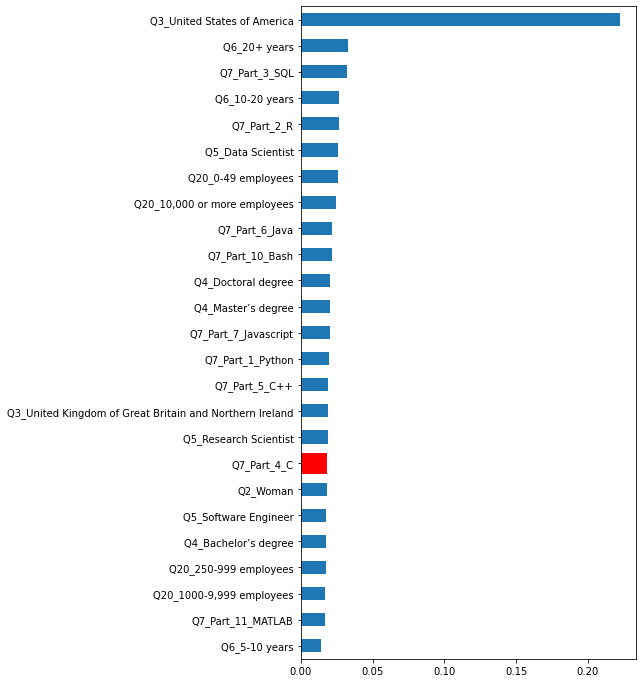

In [53]:
feat_importances = pd.Series(clf_rf.feature_importances_, index=X.columns)
ax = feat_importances.nlargest(25).sort_values().plot(kind='barh', figsize=(6, 12))
ax.barh([7], feat_importances.loc['Q2_Woman'], color='red')

-------------------------------------------------------------------------------------------------------------------------------

Next, we attempt to build models that do not include what gender the survey participant belongs to. This is to serve as an extra check to see if the model would still predicts higher salaries for males even though the model did not know that the data was for males.

In [54]:
# build models for men and women independently. See how they estimate salary on the same data 
# I think this is also a decent way to isolate individual effects of education, country, etc.
Women_Model = model_dummies[model_dummies.Q2_Woman == 1]
Men_Model = model_dummies[model_dummies.Q2_Woman == 0]

In [55]:
# create and train women's model 
women_fin = qnums(['Q4', 'Q5', 'Q7', 'Q3', 'Q6', 'Q20'], Women_Model)
Y_W = Women_Model.aprox_salary
X_W = women_fin.drop(['Q4_I prefer not to answer', 'Q5_Other', 
                  'Q7_OTHER_Other', 'Q3_Other', 'Q6_I have never written code', 'Q20_50-249 employees'], axis=1)
X_W = sm.add_constant(X_W)

Women_Model.head()

,salary_min,salary_max,aprox_salary,Q1_18-21,Q1_22-24,Q1_25-29,Q1_30-34,Q1_35-39,Q1_40-44,Q1_45-49,Q1_50-54,Q1_55-59,Q1_60-69,Q1_70+,Q2_Man,Q2_Woman,Q3_Argentina,Q3_Australia,Q3_Bangladesh,Q3_Belarus,Q3_Belgium,Q3_Brazil,Q3_Canada,Q3_Chile,Q3_China,Q3_Colombia,Q3_Egypt,Q3_France,Q3_Germany,Q3_Ghana,Q3_Greece,Q3_India,Q3_Indonesia,"Q3_Iran, Islamic Republic of...",Q3_Ireland,Q3_Israel,Q3_Italy,Q3_Japan,Q3_Kenya,Q3_Malaysia,Q3_Mexico,Q3_Morocco,Q3_Nepal,Q3_Netherlands,Q3_Nigeria,Q3_Other,Q3_Pakistan,Q3_Peru,Q3_Philippines,Q3_Poland,Q3_Portugal,Q3_Republic of Korea,Q3_Romania,Q3_Russia,Q3_Saudi Arabia,Q3_Singapore,Q3_South Africa,Q3_South Korea,Q3_Spain,Q3_Sri Lanka,Q3_Sweden,Q3_Switzerland,Q3_Taiwan,Q3_Thailand,Q3_Tunisia,Q3_Turkey,Q3_Ukraine,Q3_United Arab Emirates,Q3_United Kingdom of Great Britain and Northern Ireland,Q3_United States of America,Q3_Viet Nam,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Machine Learning Engineer,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician,Q6_1-2 years,Q6_10-20 years,Q6_20+ years,Q6_3-5 years,Q6_5-10 years,Q6_< 1 years,Q6_I have never written code,Q7_Part_1_Python,Q7_Part_2_R,Q7_Part_3_SQL,Q7_Part_4_C,Q7_Part_5_C++,Q7_Part_6_Java,Q7_Part_7_Javascript,Q7_Part_8_Julia,Q7_Part_9_Swift,Q7_Part_10_Bash,Q7_Part_11_MATLAB,Q7_Part_12_None,Q7_OTHER_Other,Q8_Bash,Q8_C,Q8_C++,Q8_Java,Q8_Javascript,Q8_Julia,Q8_MATLAB,Q8_None,Q8_Other,Q8_Python,Q8_R,Q8_SQL,Q8_Swift,"Q9_Part_1_Jupyter (JupyterLab, Jupyter Notebooks, etc)",Q9_Part_2_ RStudio,Q9_Part_3_Visual Studio,Q9_Part_4_Visual Studio Code (VSCode),Q9_Part_5_ PyCharm,Q9_Part_6_ Spyder,Q9_Part_7_ Notepad++,Q9_Part_8_ Sublime Text,Q9_Part_9_ Vim / Emacs,Q9_Part_10_ MATLAB,Q9_Part_11_None,Q9_OTHER_Other,Q10_Part_1_ Kaggle Notebooks,Q10_Part_2_Colab Notebooks,Q10_Part_3_Azure Notebooks,Q10_Part_4_ Paperspace / Gradient,Q10_Part_5_ Binder / JupyterHub,Q10_Part_6_ Code Ocean,Q10_Part_7_ IBM Watson Studio,Q10_Part_8_ Amazon Sagemaker Studio,Q10_Part_9_ Amazon EMR Notebooks,Q10_Part_10_Google Cloud AI Platform Notebooks,Q10_Part_11_Google Cloud Datalab Notebooks,Q10_Part_12_ Databricks Collaborative Notebooks,Q10_Part_13_None,Q10_OTHER_Other,"Q11_A cloud computing platform (AWS, Azure, GCP, hosted notebooks, etc)","Q11_A deep learning workstation (NVIDIA GTX, LambdaLabs, etc)",Q11_A personal computer or laptop,Q11_None,Q11_Other,Q12_Part_1_GPUs,Q12_Part_2_TPUs,Q12_Part_3_None,Q12_OTHER_Other,Q13_2-5 times,Q13_6-25 times,Q13_More than 25 times,Q13_Never,Q13_Once,Q14_Part_1_ Matplotlib,Q14_Part_2_ Seaborn,Q14_Part_3_ Plotly / Plotly Express,Q14_Part_4_ Ggplot / ggplot2,Q14_Part_5_ Shiny,Q14_Part_6_ D3 js,Q14_Part_7_ Altair,Q14_Part_8_ Bokeh,Q14_Part_9_ Geoplotlib,Q14_Part_10_ Leaflet / Folium,Q14_Part_11_None,Q14_OTHER_Other,Q15_1-2 years,Q15_10-20 years,Q15_2-3 years,Q15_20 or more years,Q15_3-4 years,Q15_4-5 years,Q15_5-10 years,Q15_I do not use machine learning methods,Q15_Under 1 year,Q16_Part_1_ Scikit-learn,Q16_Part_2_ TensorFlow,Q16_Part_3_ Keras,Q16_Part_4_ PyTorch,Q16_Part_5_ Fast.ai,Q16_Part_6_ MXNet,Q16_Part_7_ Xgboost,Q16_Part_8_ LightGBM,Q16_Part_9_ CatBoost,Q16_Part_10_ Prophet,Q16_Part_11_ H2O 3,Q16_Part_12_ Caret,Q16_Part_13_ Tidymodels,Q16_Part_14_ JAX,Q16_Part_15_None,Q16_OTHER_Other,Q17_Part_1_Linear or Logistic Regression,Q17_Part_2_Decision Trees or Random Forests,"Q17_Part_3_Gradient Boosting Machines (xgboost, lightgbm, etc)",Q17_Part_4_Bayesian Approaches,Q17_Part_5_Evolutionary Approaches,"Q17_Part_6_Dense Neural Networks (MLPs, etc)",Q17_Part_7_Convolutional Neural Networks,Q17_Part_8_Generative Adversarial Networks,Q17_Part_9_Recurrent Neural Networks,"Q17_Part_10_Transformer Networks (BERT, gpt-3, etc)",Q17_Part_11_None,Q1

In [56]:
model_W = sm.OLS(Y_W, X_W)
results_W = model_W.fit()
results_W.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           aprox_salary   R-squared:                       0.454
Model:                            OLS   Adj. R-squared:                  0.422
Method:                 Least Squares   F-statistic:                     14.37
Date:                Wed, 27 Jul 2022   Prob (F-statistic):          5.16e-150
Time:                        15:55:28   Log-Likelihood:                -20267.
No. Observations:                1683   AIC:                         4.072e+04
Df Residuals:                    1590   BIC:                         4.122e+04
Df Model:                          92                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                 8183.1110   1.07e+04      0.763      0.445   -1.28e+04    2.92e+04
Q4_Bachelor’s degree                                                  3056.2863   9321.455      0.328      0.743   -1.52e+04    2.13e+04
Q4_Doctoral degree                                                    1.365e+04   9532.967      1.432      0.152   -5046.439    3.24e+04
Q4_Master’s degree                                                    9813.5973   9257.062      1.060      0.289   -8343.732     2.8e+04
Q4_No formal education past high school                               4502.3068   2.37e+04      0.190      0.849    -4.2e+04     5.1e+04
Q4_Professional degree                                                1.096e+04   1.04e+04      1.051      0.294   -9504.093    3.14e+04
Q4_Some college/university study without earning a bachelor’s degree -2733.4509   1.16e+04     -0.235      0.814   -2.56e+04    2.01e+04
Q5_Business Analyst                                                   8338.4117   4835.815      1.724      0.085   -1146.832    1.78e+04
Q5_DBA/Database Engineer                                             -8461.8924    1.3e+04     -0.652      0.515   -3.39e+04     1.7e+04
Q5_Data Analyst                                                       -505.3368   3921.993     -0.129      0.897   -8198.158    7187.485
Q5_Data Engineer                                                      9645.7086   6837.554      1.411      0.159   -3765.860    2.31e+04
Q5_Data Scientist                                                     9812.0362   3762.486      2.608      0.009    2432.082    1.72e+04
Q5_Machine Learning Engineer                                           989.9825   5247.103      0.189      0.850   -9301.985    1.13e+04
Q5_Product/Project Manager                                            2.074e+04   6223.540      3.333      0.001    8536.779     3.3e+04
Q5_Research Scientist                                                -2633.8866   4540.896     -0.580      0.562   -1.15e+04    6272.886
Q5_Software Engineer                                                  3043.3358   4454.516      0.683      0.495   -5694.006    1.18e+04
Q5_Statistician                                                       -721.8901   6659.766     -0.108      0.914   -1.38e+04    1.23e+04
Q7_Part_1_Python                                                     -1987.9513   3034.027     -0.655      0.512   -7939.066    3963.163
Q7_Part_2_R                                                          -3503.0673   2547.904     -1.375      0.169   -8500.673    1494.538
Q7_Part_3_SQL                                                        

In [57]:
results_reg_W = model_W.fit_regularized(L1_wt=1, alpha=5)
final_W = sm.regression.linear_model.OLSResults(model_W, results_reg_W.params, model_W.normalized_cov_params)
print(final_W.summary())

                            OLS Regression Results                            
Dep. Variable:           aprox_salary   R-squared:                       0.453
Model:                            OLS   Adj. R-squared:                  0.421
Method:                 Least Squares   F-statistic:                     14.30
Date:                Wed, 27 Jul 2022   Prob (F-statistic):          2.41e-149
Time:                        15:55:30   Log-Likelihood:                -20268.
No. Observations:                1683   AIC:                         4.072e+04
Df Residuals:                    1590   BIC:                         4.123e+04
Df Model:                          92                                         
Covariance Type:            nonrobust                                         
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

In [58]:
# create and train men's model 
men_fin = qnums(['Q4', 'Q5', 'Q7', 'Q3', 'Q6', 'Q20'], Men_Model)
Y_M = Men_Model.aprox_salary
X_M = men_fin.drop(['Q4_I prefer not to answer', 'Q5_Other', 
                  'Q7_OTHER_Other', 'Q3_Other', 'Q6_I have never written code', 'Q20_50-249 employees'], axis=1)
X_M = sm.add_constant(X_M)

model_M = sm.OLS(Y_M, X_M)
results_M = model_M.fit()
results_M.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           aprox_salary   R-squared:                       0.386
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     59.90
Date:                Wed, 27 Jul 2022   Prob (F-statistic):               0.00
Time:                        15:55:30   Log-Likelihood:            -1.0891e+05
No. Observations:                8872   AIC:                         2.180e+05
Df Residuals:                    8779   BIC:                         2.187e+05
Df Model:                          92                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
const                                                                 2.113e+04   5925.627      3.565      0.000    9509.814    3.27e+04
Q4_Bachelor’s degree                                                  2269.9925   4888.071      0.464      0.642   -7311.771    1.19e+04
Q4_Doctoral degree                                                     1.03e+04   5068.551      2.032      0.042     365.453    2.02e+04
Q4_Master’s degree                                                    5361.5291   4853.175      1.105      0.269   -4151.832    1.49e+04
Q4_No formal education past high school                              -4760.1632   7067.155     -0.674      0.501   -1.86e+04    9093.116
Q4_Professional degree                                                8982.4124   5472.166      1.641      0.101   -1744.315    1.97e+04
Q4_Some college/university study without earning a bachelor’s degree    43.3111   5553.019      0.008      0.994   -1.08e+04    1.09e+04
Q5_Business Analyst                                                  -2030.1665   2720.312     -0.746      0.456   -7362.616    3302.283
Q5_DBA/Database Engineer                                             -8956.3773   5665.434     -1.581      0.114   -2.01e+04    2149.200
Q5_Data Analyst                                                      -1.004e+04   2301.624     -4.364      0.000   -1.46e+04   -5532.784
Q5_Data Engineer                                                     -5313.9576   3377.355     -1.573      0.116   -1.19e+04    1306.450
Q5_Data Scientist                                                     4194.0621   1985.915      2.112      0.035     301.204    8086.920
Q5_Machine Learning Engineer                                          1835.2211   2471.241      0.743      0.458   -3008.990    6679.432
Q5_Product/Project Manager                                            9501.9436   2762.356      3.440      0.001    4087.079    1.49e+04
Q5_Research Scientist                                                -8548.2046   2554.309     -3.347      0.001   -1.36e+04   -3541.161
Q5_Software Engineer                                                 -6785.4557   2225.012     -3.050      0.002   -1.11e+04   -2423.911
Q5_Statistician                                                      -6386.1253   4197.408     -1.521      0.128   -1.46e+04    1841.778
Q7_Part_1_Python                                                      1221.7586   1805.164      0.677      0.499   -2316.786    4760.303
Q7_Part_2_R                                                              0.2495   1408.716      0.000      1.000   -2761.163    2761.662
Q7_Part_3_SQL                                                        

In [59]:
results_reg_M = model_M.fit_regularized(L1_wt=1, alpha= 5)
final_M = sm.regression.linear_model.OLSResults(model_M, results_reg_M.params, model_M.normalized_cov_params)
print(final_M.summary())

                            OLS Regression Results                            
Dep. Variable:           aprox_salary   R-squared:                       0.384
Model:                            OLS   Adj. R-squared:                  0.378
Method:                 Least Squares   F-statistic:                     59.54
Date:                Wed, 27 Jul 2022   Prob (F-statistic):               0.00
Time:                        15:55:33   Log-Likelihood:            -1.0892e+05
No. Observations:                8872   AIC:                         2.180e+05
Df Residuals:                    8779   BIC:                         2.187e+05
Df Model:                          92                                         
Covariance Type:            nonrobust                                         
                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

In [60]:
# run model on all data & compare. Keep in mind that the data should have been split into train and test set in order to
# compareresults effectively. This was not done here.
combined_data = qnums(['Q4', 'Q5', 'Q7', 'Q3', 'Q6', 'Q20'], model_dummies).drop(['Q4_I prefer not to answer', 
                                                                                  'Q5_Other', 'Q7_OTHER_Other', 'Q3_Other', 
                                                                                  'Q6_I have never written code', 
                                                                                  'Q20_50-249 employees'], axis=1)
male_preds = final_M.predict(np.array(sm.add_constant(combined_data)))
female_preds = final_W.predict(np.array(sm.add_constant(combined_data)))

In [61]:
# add prediction values to the data
combined_data['male_preds'] = male_preds
combined_data['female_preds'] = female_preds

In [62]:
px.scatter(combined_data, x='male_preds', y='female_preds', trendline='ols', trendline_color_override='red')

Scatterplot showing the female predictions vs the male predictions. Hovering over the trend line we see that the formula for the straight line is: 

                                 female_predictor = 0.838546 * male_predictor - 2659.72 

which shows that the female predictor predicts significantly less than the male predictor.

In [63]:
# combine with the approximate salary column and compare with predictor columns.
combined_data['aprox_salary'] = model_dummies.aprox_salary
combined_data.head()

,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Machine Learning Engineer,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician,Q7_Part_1_Python,Q7_Part_2_R,Q7_Part_3_SQL,Q7_Part_4_C,Q7_Part_5_C++,Q7_Part_6_Java,Q7_Part_7_Javascript,Q7_Part_8_Julia,Q7_Part_9_Swift,Q7_Part_10_Bash,Q7_Part_11_MATLAB,Q7_Part_12_None,Q3_Argentina,Q3_Australia,Q3_Bangladesh,Q3_Belarus,Q3_Belgium,Q3_Brazil,Q3_Canada,Q3_Chile,Q3_China,Q3_Colombia,Q3_Egypt,Q3_France,Q3_Germany,Q3_Ghana,Q3_Greece,Q3_India,Q3_Indonesia,"Q3_Iran, Islamic Republic of...",Q3_Ireland,Q3_Israel,Q3_Italy,Q3_Japan,Q3_Kenya,Q3_Malaysia,Q3_Mexico,Q3_Morocco,Q3_Nepal,Q3_Netherlands,Q3_Nigeria,Q3_Pakistan,Q3_Peru,Q3_Philippines,Q3_Poland,Q3_Portugal,Q3_Republic of Korea,Q3_Romania,Q3_Russia,Q3_Saudi Arabia,Q3_Singapore,Q3_South Africa,Q3_South Korea,Q3_Spain,Q3_Sri Lanka,Q3_Sweden,Q3_Switzerland,Q3_Taiwan,Q3_Thailand,Q3_Tunisia,Q3_Turkey,Q3_Ukraine,Q3_United Arab Emirates,Q3_United Kingdom of Great Britain and Northern Ireland,Q3_United States of America,Q3_Viet Nam,Q6_1-2 years,Q6_10-20 years,Q6_20+ years,Q6_3-5 years,Q6_5-10 years,Q6_< 1 years,Q20_0-49 employees,"Q20_10,000 or more employees","Q20_1000-9,999 employees",Q20_250-999 employees,male_preds,female_preds,aprox_salary
2,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,126872.821615,114828.899434,112499.5
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,29968.773101,34281.097398,17499.5
4,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,132427.010478,122032.800965,137499.5
9,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,94000.507165,84820.444771,74999.5
12,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,91886.090551,76772.188267,34999.5


In [64]:
# looking at the male and female predictor predictions at the different apporximate salaries
px.scatter(combined_data.sort_values('aprox_salary'), x = 'aprox_salary', y = ['male_preds','female_preds'])

We see that the male predictions pop up frequently at the top of the scatterplots. This is an indication that the male predictor was predicting higher salaries more frequently.

In [65]:
# looking at the difference in salaries between the male perdictions and female predictions
combined_data['projected_diff'] = combined_data.male_preds - combined_data.female_preds

In [66]:
combined_data.projected_diff.mean()

10059.919985464097

In [67]:
combined_data.projected_diff.std()

15363.821440407619

In [68]:
# converting negative values to 1 and positive values to 0 for easy comparison
combined_data['women_prj_higher'] = combined_data.projected_diff.apply(lambda x: 1 if x < 0 else 0)

In [69]:
# here, we see that the female predictor predicted a higher salary than the male predictor about a quarter of the time.
combined_data.women_prj_higher.value_counts()

0    8344
1    2211
Name: women_prj_higher, dtype: int64

-------------------------------------------------------------------------------------------------------------------------------